# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

E:\anaconda\lib\site-packages\gensim\utils.py:1197: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [3]:
#from google.colab import drive
#drive.mount('/content/drive')

In [7]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (525814, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [8]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [9]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [10]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [11]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [12]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [13]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [14]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(364173, 10)

In [15]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

69.25890143662969

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [16]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [17]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [18]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)
final = final.sample(50000)

final = final.sort_values(by = 'Time',ascending = True)


#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()
final.head()

(364171, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
417883,451903,B00004CXX9,A2DEE7F9XKP3ZR,jerome,0,1,1,959990400,Research,I'm getting crazy.<p>Is it really impossible t...
346115,374421,B00004CI84,A1FJOY14X3MUHE,Justin Howard,2,2,1,966297600,"A fresh, original film from master storyteller...","This is such a great film, I don't even know h..."
346054,374358,B00004CI84,A1HWMNSQF14MP8,will@socialaw.com,1,2,1,978134400,A Afterlife Success,"Many movies, have dealt with the figure of dea..."
346037,374339,B00004CI84,AZRJH4JFB59VC,Lynwood E. Hines,21,23,0,997228800,"Great movie, terrible DVD",I am continually amazed at the shoddy treatmen...
346140,374449,B00004CI84,A3K3YJWV0N54ZO,Joey,2,3,1,1001289600,"Beetlejuice is a greatmovie, but they cheated ...",Just to warn you. when in trying to trick you ...


#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [19]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

I'm getting crazy.<p>Is it really impossible today not to find the French VHS version of this film ?<p>Could U please tell me something about it ? Tks
Better than the Sun Maid Mix Fruits, like this one more, nice for oat meals and quick fruit yugort mix.<br /><br />the fruits are good both in taste and smell.<br /><br />bought a dozen of it and will buy some more.
I was a little be leary of buying this after having tried the Annie's whole wheat shell macaroni and cheese which we thought was just horrible.  This macaroni, however, tasted wonderful!  I think that this has a lot more flavor than the Kraft macaroni and it's so much better for you too!  At first, my two year old would not try it as it was not the yellow color of the Kraft macaroni.  So, I added a little bit of orange food coloring (the sauce is white so any color would work perfectly) and he was so excited about orange macaroni that he gobbled it right up, telling me repeatedly how yummy it was.  I think we can have some fu

In [20]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

I'm getting crazy.<p>Is it really impossible today not to find the French VHS version of this film ?<p>Could U please tell me something about it ? Tks


In [21]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

I'm getting crazy.Is it really impossible today not to find the French VHS version of this film ?Could U please tell me something about it ? Tks
Better than the Sun Maid Mix Fruits, like this one more, nice for oat meals and quick fruit yugort mix.the fruits are good both in taste and smell.bought a dozen of it and will buy some more.
I was a little be leary of buying this after having tried the Annie's whole wheat shell macaroni and cheese which we thought was just horrible.  This macaroni, however, tasted wonderful!  I think that this has a lot more flavor than the Kraft macaroni and it's so much better for you too!  At first, my two year old would not try it as it was not the yellow color of the Kraft macaroni.  So, I added a little bit of orange food coloring (the sauce is white so any color would work perfectly) and he was so excited about orange macaroni that he gobbled it right up, telling me repeatedly how yummy it was.  I think we can have some fun mixing up the colors in the 

In [22]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [23]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

I was a little be leary of buying this after having tried the Annie is whole wheat shell macaroni and cheese which we thought was just horrible.  This macaroni, however, tasted wonderful!  I think that this has a lot more flavor than the Kraft macaroni and it is so much better for you too!  At first, my two year old would not try it as it was not the yellow color of the Kraft macaroni.  So, I added a little bit of orange food coloring (the sauce is white so any color would work perfectly) and he was so excited about orange macaroni that he gobbled it right up, telling me repeatedly how yummy it was.  I think we can have some fun mixing up the colors in the future.  I would highly recommend this!


In [24]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

I'm getting crazy.<p>Is it really impossible today not to find the French VHS version of this film ?<p>Could U please tell me something about it ? Tks


In [25]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

I was a little be leary of buying this after having tried the Annie is whole wheat shell macaroni and cheese which we thought was just horrible This macaroni however tasted wonderful I think that this has a lot more flavor than the Kraft macaroni and it is so much better for you too At first my two year old would not try it as it was not the yellow color of the Kraft macaroni So I added a little bit of orange food coloring the sauce is white so any color would work perfectly and he was so excited about orange macaroni that he gobbled it right up telling me repeatedly how yummy it was I think we can have some fun mixing up the colors in the future I would highly recommend this 


In [26]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [27]:
# Combining all the above stundents 
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in (final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

In [28]:
preprocessed_reviews[1500]

'little leary buying tried annie whole wheat shell macaroni cheese thought horrible macaroni however tasted wonderful think lot flavor kraft macaroni much better first two year old would not try not yellow color kraft macaroni added little bit orange food coloring sauce white color would work perfectly excited orange macaroni gobbled right telling repeatedly yummy think fun mixing colors future would highly recommend'

# ASSIGNMENT
<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

## [5.1] K-Means Clustering

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [84]:
import pickle

def savetofile(obj,filename):
  pickle.dump(obj,open(filename+".p",'wb'))


def openfromfile(filename):
  temp = pickle.load(open(filename+".p",'rb'))
  return temp

## BAG OF WORDS

In [129]:
count_vect = CountVectorizer(min_df = 1000) #min_df gets the words that are being repeated in the whole corpus at least 1000 number of times
bow = count_vect.fit_transform(preprocessed_reviews)
print("the type of count vectorizer :",type(bow))
print("the shape of out text BOW vectorizer : ",bow.get_shape())
print("the number of unique words :", bow.get_shape()[1])

the type of count vectorizer : <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer :  (50000, 314)
the number of unique words : 314


In [86]:
# finding the best k
from sklearn.cluster import KMeans
import time


def best_k(data):
    start_time = time.time()#starting of execution
    k_values = [2,3,4,5,6,7,8,9,10]
    loss = []#appending the inertia value for each optimal cluster
    for i in k_values:
        kmeans = KMeans(n_clusters=i).fit(data)
        loss.append(kmeans.inertia_)

    end_time = time.time()

    print('Total time taken for execution is {} seconds'.format(end_time-start_time))
    return loss

In [87]:
loss_bow = openfromfile('loss_bow')

In [88]:
#fucntion for elbow method to plot loss vs hyperparameter
def elbow(val,t):
    sns.set_style('darkgrid')
    
    plt.figure(figsize=(20,5))
    plt.plot(val,t,'bx-')
    #plot for the values
    plt.title('Loss vs hyperparameter ',fontsize=14)
    plt.xlabel('K',fontsize=14)
    plt.ylabel('Loss',fontsize=14)
    plt.show()
    
    

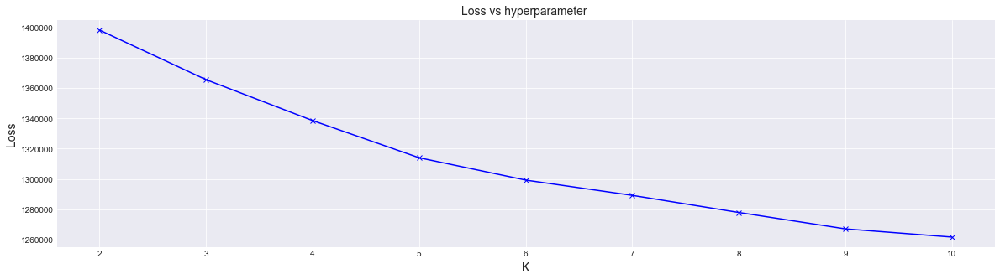

In [89]:
val = [2,3,4,5,6,7,8,9,10]
elbow(val,loss_bow)

from above k vs inertia plot we choose the optimal value of n_clusters to be 8

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [137]:
# Please write all the code with proper documentation
#choosing best k = 8
from collections import defaultdict


"""This function will perform kmeans with optimal number of clusters 
    and return the data frame with text and cluster labels as columns"""
def optimal(n,data):
    optimal_kmeans = KMeans(n_clusters = n).fit(data)
    #y_pred =  optimal_kmeans.predict(data)
    #data frame for cluster and text
    df = pd.DataFrame(preprocessed_reviews,columns = ['text'])
    df['cluster_label'] = optimal_kmeans.labels_
    print(df.head())
    return df

#=================================================================================================================

"""This function will plot the number of data points in each cluster"""
def bar_plot(df,n_clusters):
    
    values = df['cluster_label'].value_counts()#finding the number of reviews in each clusterval
    d = defaultdict(int)#initializing the dictionary for getting the values 
    for i in range(n_clusters):
        d[i] = values[i]#we are using the cluster label as keys and number of data points as the value
    plt.bar(d.keys(),d.values(),alpha = 0.4)
    plt.title('# Points in every cluster')
    plt.xlabel("Clusters")
    plt.ylabel('Number of points')
    
#==============================================================================================================

"""This function will plot the wordcloud for each cluster"""
from wordcloud import WordCloud

def cloud(cluster):
    
    text = ' '#this will give us the words in review texts seperated by spaces
    for rev in cluster:
        text = text + " " + rev
    wordcloud = WordCloud(width = 1200, height = 600,background_color = 'white',stopwords  = stopwords ).generate(text)
    #wordcloud()
    plt.figure(figsize = (30,5))
    plt.imshow(wordcloud,interpolation = 'bilinear')
    plt.axis('off')
    plt.margins(x = 0, y =0)
    plt.show()


In [134]:
df_bow = optimal(8,bow)#dataframe

                                                text  cluster_label
0  getting crazy really impossible today not find...              5
1  great film not even know sum first completely ...              5
2  many movies dealt figure death dead good angel...              5
3  continually amazed shoddy treatment movies get...              5
4  warn trying trick widescreen format company ma...              0


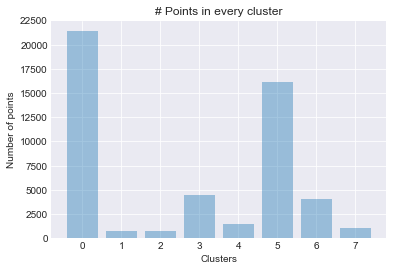

In [135]:
bar_plot(df_bow,8)

In [52]:
#initializing the lists for reviews in each cluster
cluster_1 = []
cluster_2 = []
cluster_3 = []
cluster_4 = []
cluster_5 = []
cluster_6 = []
cluster_7 = []
cluster_8 = []

for i in range(optimal_kmeans.labels_.shape[0]):
    
    if optimal_kmeans.labels_[i] == 0:
        cluster_1.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 1:
        cluster_2.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 2:
        cluster_3.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 3:
        cluster_4.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 4:
        cluster_5.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 5:
        cluster_6.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 6:
        cluster_7.append(preprocessed_reviews[i])
    else:
        cluster_8.append(preprocessed_reviews[i])

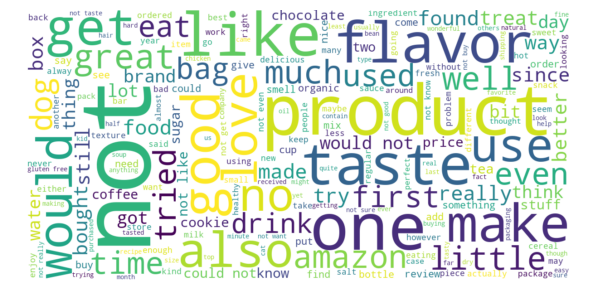

In [54]:
cloud(cluster_1)

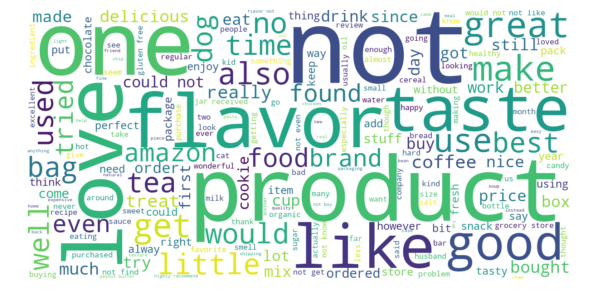

In [56]:
cloud(cluster_2)

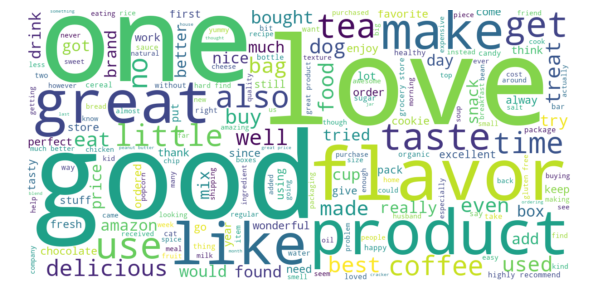

In [57]:
cloud(cluster_3)

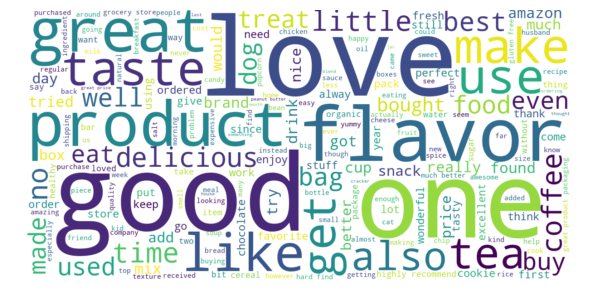

In [58]:
cloud(cluster_4)

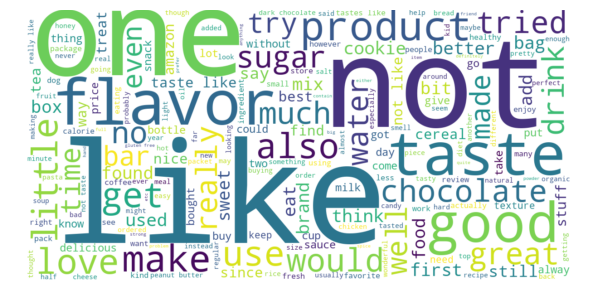

In [59]:
cloud(cluster_5)

In [ ]:
cloud(cluster_6)

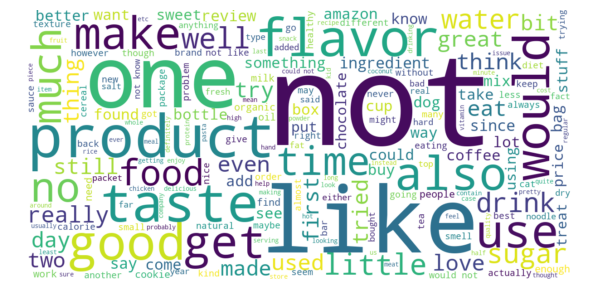

In [60]:
cloud(cluster_7)

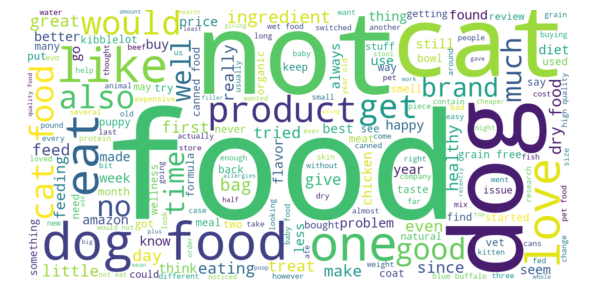

In [61]:
cloud(cluster_8)

### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [63]:
# Please write all the code with proper documentation

tfidf_vect = TfidfVectorizer(min_df = 100)
tfidf_vect.fit(preprocessed_reviews)
print('Some of the unique features in the corpus are :',tfidf_vect.get_feature_names()[:10])
print('==================================================')


tfidf =tfidf_vect.transform(preprocessed_reviews)
print('the type of vectorizer is :',type(tfidf))
print('Shape of text from tfidf vectorizer are:',tfidf.get_shape())
print('Number of words including unigrams and bi grams are',tfidf.get_shape()[1])

Some of the unique features in the corpus are : ['able', 'absolute', 'absolutely', 'according', 'acid', 'acidic', 'across', 'active', 'actual', 'actually']
the type of vectorizer is : <class 'scipy.sparse.csr.csr_matrix'>
Shape of text from tfidf vectorizer are: (50000, 2238)
Number of words including unigrams and bi grams are 2238


In [0]:
loss_tfidf = best_k(tfidf)

Total time taken for execution is 5896.058480501175 seconds


In [65]:
loss_tfidf = openfromfile('loss_tfidf')

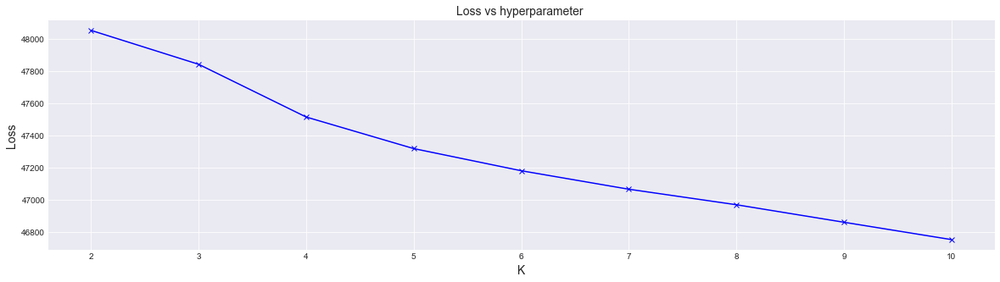

In [68]:
elbow(val,loss_tfidf)

We get best value of k as 7,as after which the loss decreased linearly

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

In [138]:
#choosing best k = 7
df_tfidf = optimal(7,tfidf)

                                                text  cluster_label
0  getting crazy really impossible today not find...              1
1  great film not even know sum first completely ...              0
2  many movies dealt figure death dead good angel...              0
3  continually amazed shoddy treatment movies get...              0
4  warn trying trick widescreen format company ma...              0


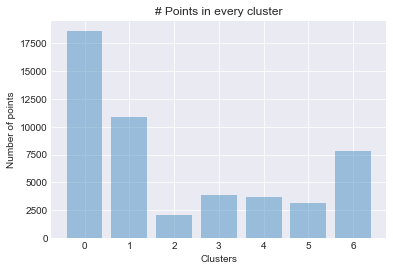

In [139]:
bar_plot(df_tfidf,7)

In [70]:
cluster_1 = []
cluster_2 = []
cluster_3 = []
cluster_4 = []
cluster_5 = []
cluster_6 = []
cluster_7 = []



for i in range(optimal_kmeans.labels_.shape[0]):
    
    if optimal_kmeans.labels_[i] == 0:
        cluster_1.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 1:
        cluster_2.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 2:
        cluster_3.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 3:
        cluster_4.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 4:
        cluster_5.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 5:
        cluster_6.append(preprocessed_reviews[i])
    else:
        cluster_7.append(preprocessed_reviews[i])


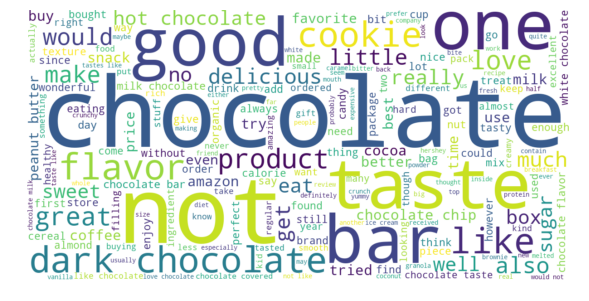

In [71]:
cloud(cluster_1)

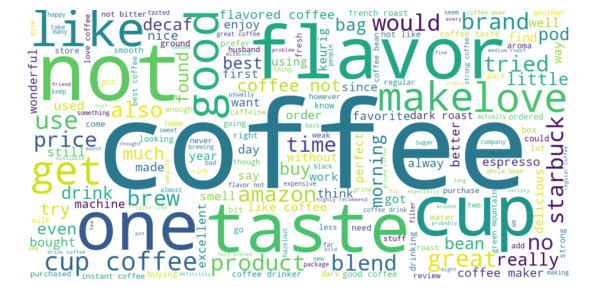

In [72]:
cloud(cluster_2)

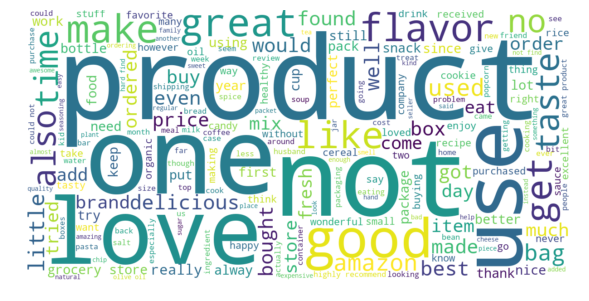

In [74]:
cloud(cluster_3)

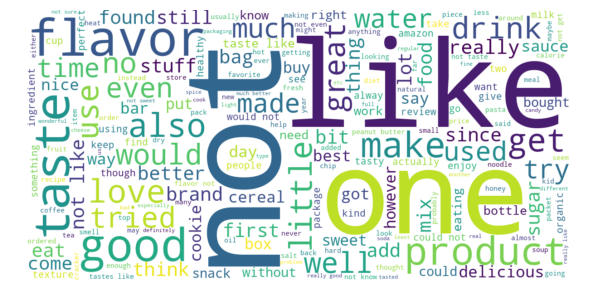

In [75]:
cloud(cluster_4)

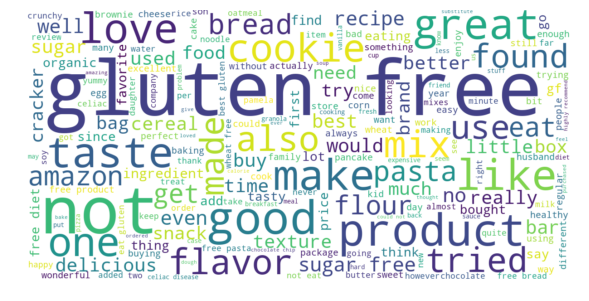

In [76]:
cloud(cluster_5)

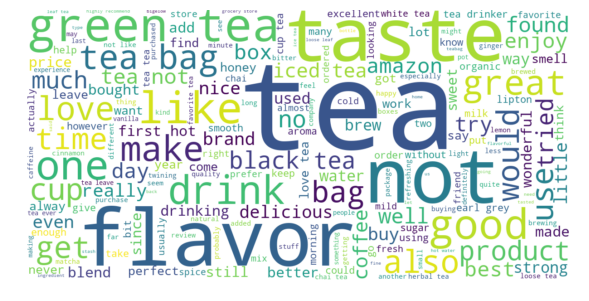

In [77]:
cloud(cluster_6)

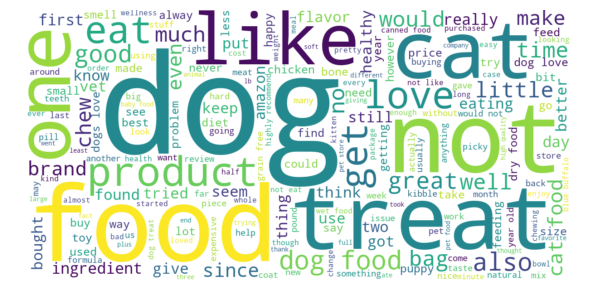

In [78]:
cloud(cluster_7)

### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [79]:
#computing the word 2 vectors

reviews = []
for rev in preprocessed_reviews:
  reviews.append(rev.split())

#getting the data for word2 vec implementation
# this line of code trains the w2v model on the give list of sentances   

w2v_model=Word2Vec(reviews,min_count=5,size=50, workers=4)# min_count = 5 considers only words that occured atleast 5 times

w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print('sample words :',w2v_words[0:50])




number of words that occured minimum 5 times  13739
sample words : ['getting', 'crazy', 'really', 'impossible', 'today', 'not', 'find', 'french', 'version', 'film', 'could', 'u', 'please', 'tell', 'something', 'great', 'even', 'know', 'sum', 'first', 'completely', 'original', 'unlike', 'ever', 'seen', 'second', 'comedy', 'kind', 'weird', 'feel', 'tim', 'burton', 'look', 'probably', 'like', 'best', 'art', 'director', 'bo', 'welch', 'show', 'us', 'world', 'anything', 'movie', 'would', 'recommend', 'anyone', 'looking', 'enjoyable']


In [80]:
# Please write all the code with proper documentation

#computing average word to vector for training data 
avgW2V = [] # the avg-w2v for each sentence/review is stored in this list
for sent in (reviews):
    sent_vec = np.zeros(50) 
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    avgW2V.append(sent_vec)

print(len(avgW2V))#number of data points




50000


In [81]:
loss_avgw2v = openfromfile('loss_avgw2v')

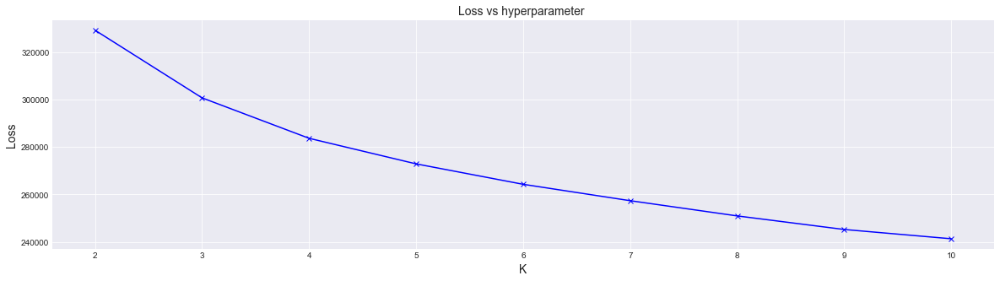

In [141]:
elbow(val,loss_avgw2v)

here we choose number of optimal clusters as 7.

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

In [142]:
df_avgw2v = optimal(7,avgW2V)

                                                text  cluster_label
0  getting crazy really impossible today not find...              5
1  great film not even know sum first completely ...              5
2  many movies dealt figure death dead good angel...              5
3  continually amazed shoddy treatment movies get...              5
4  warn trying trick widescreen format company ma...              5


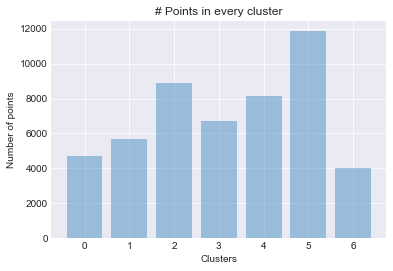

In [145]:
bar_plot(df_avgw2v,7)

In [146]:
# Please write all the code with proper documentation

cluster_1 = []
cluster_2 = []
cluster_3 = []
cluster_4 = []
cluster_5 = []
cluster_6 = []
cluster_7 = []



for i in range(optimal_kmeans.labels_.shape[0]):
    
    if optimal_kmeans.labels_[i] == 0:
        cluster_1.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 1:
        cluster_2.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 2:
        cluster_3.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 3:
        cluster_4.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 4:
        cluster_5.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 5:
        cluster_6.append(preprocessed_reviews[i])
    else:
        cluster_7.append(preprocessed_reviews[i])


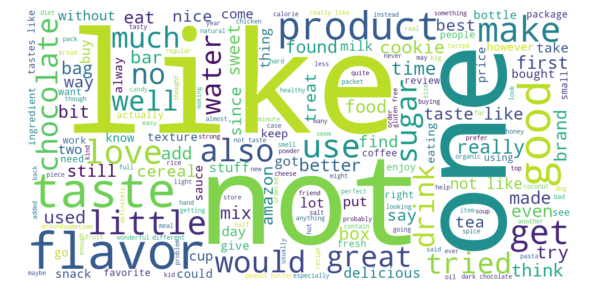

In [147]:
cloud(cluster_1)

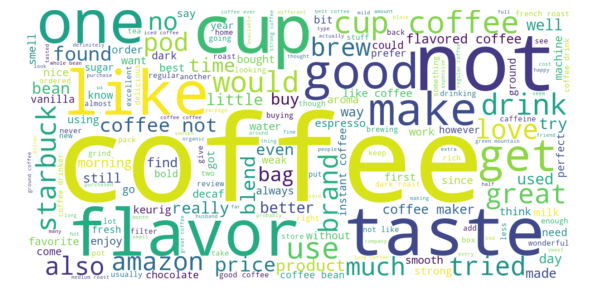

In [148]:
cloud(cluster_2)

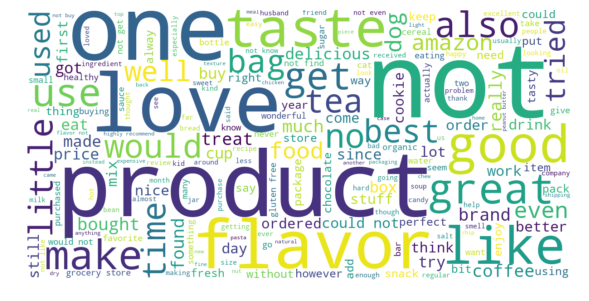

In [149]:
cloud(cluster_3)

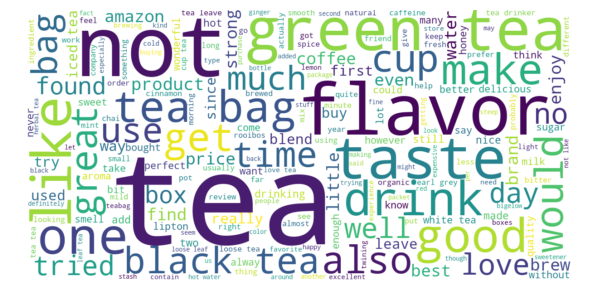

In [150]:
cloud(cluster_4)

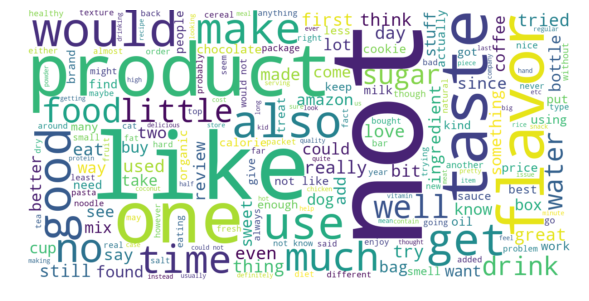

In [151]:
cloud(cluster_5)

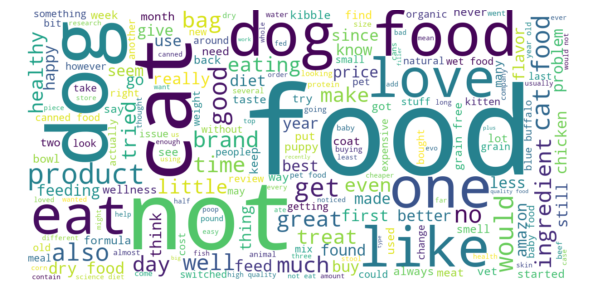

In [152]:
cloud(cluster_6)

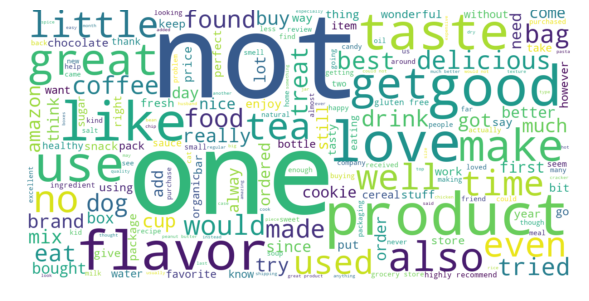

In [153]:
cloud(cluster_7)

### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [154]:
import itertools

vect = TfidfVectorizer(min_df = 10)#initializing the tfidf vectorizer 

tf_idf = vect.fit_transform(preprocessed_reviews)#fitting the training data
dictionary = dict(zip(vect.get_feature_names(), list(vect.idf_)))#zipping both of the feature names and vectorizer idf scores
dict(itertools.islice(dictionary.items(),20))
#printing first 20 elements of the dictionary

tfidf_feat = vect.get_feature_names()

tfidfw2v = []; # the tfidf-w2v for each sentence/review in training set is stored in this list
row=0;
for sent in (reviews): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidfw2v.append(sent_vec)
    row += 1    
print(len(tfidfw2v))


50000


In [155]:
loss_tfidf = openfromfile('loss_tfidf')

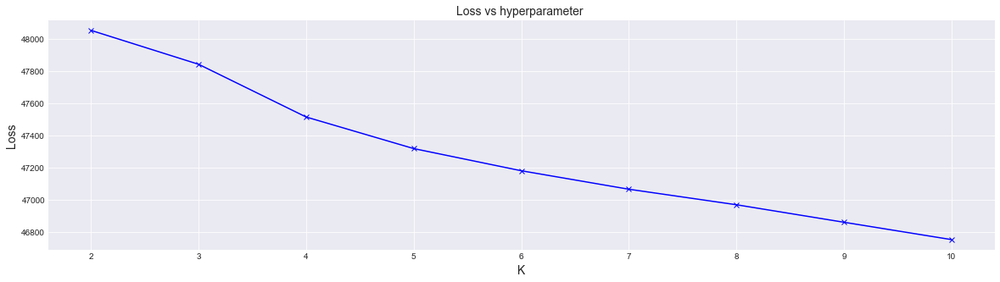

In [156]:
# Please write all the code with proper documentation
elbow(val,loss_tfidf)

taing value of optimal number of clusters to be 5

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

In [161]:
df_tfidfw2v = optimal(5,tfidfw2v)

                                                text  cluster_label
0  getting crazy really impossible today not find...              0
1  great film not even know sum first completely ...              0
2  many movies dealt figure death dead good angel...              0
3  continually amazed shoddy treatment movies get...              0
4  warn trying trick widescreen format company ma...              1


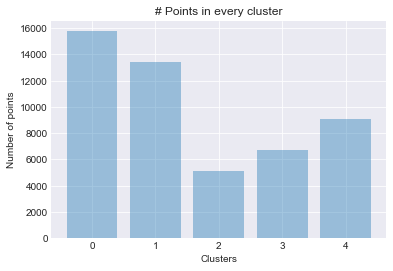

In [162]:
bar_plot(df_tfidfw2v,5)

In [163]:
cluster_1 = []
cluster_2 = []
cluster_3 = []
cluster_4 = []
cluster_5 = []




for i in range(optimal_kmeans.labels_.shape[0]):
    
    if optimal_kmeans.labels_[i] == 0:
        cluster_1.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 1:
        cluster_2.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 2:
        cluster_3.append(preprocessed_reviews[i])
    elif optimal_kmeans.labels_[i] == 3:
        cluster_4.append(preprocessed_reviews[i])
    else:
        cluster_5.append(preprocessed_reviews[i])

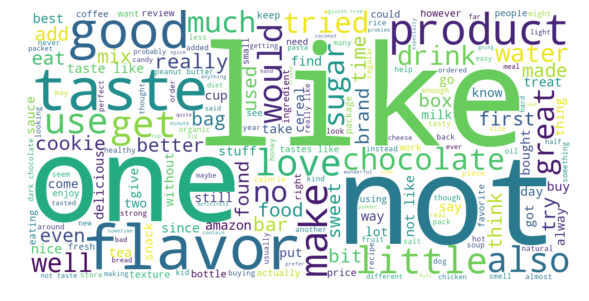

In [164]:
cloud(cluster_1)

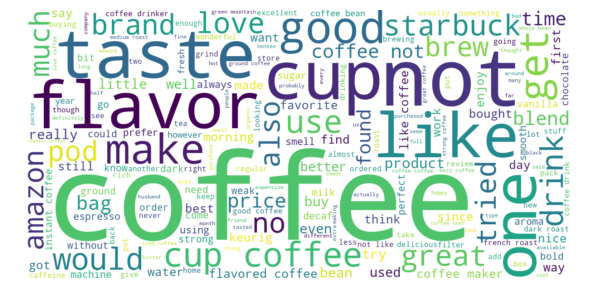

In [165]:
cloud(cluster_2)

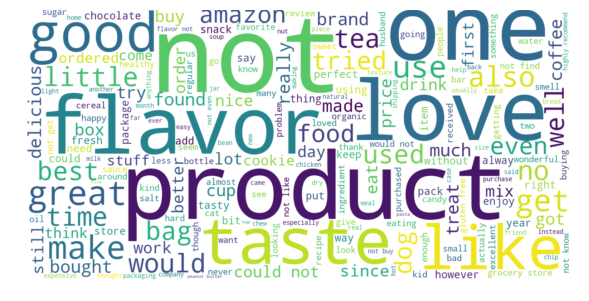

In [166]:
cloud(cluster_3)

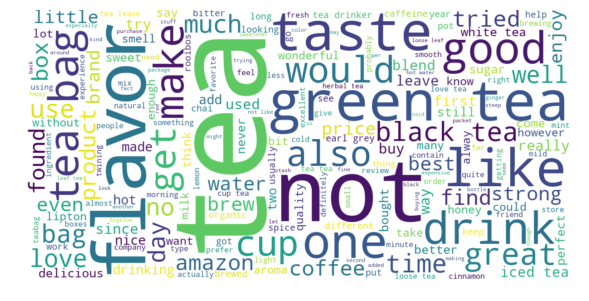

In [167]:
cloud(cluster_4)

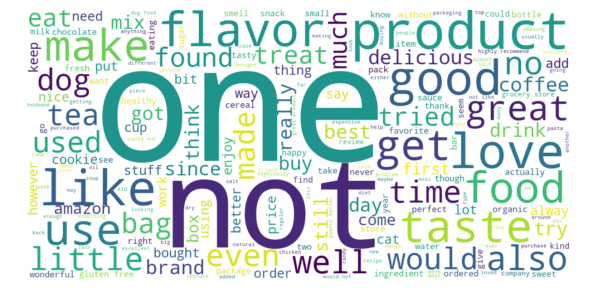

In [168]:
cloud(cluster_5)

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [0]:
preprocessed_reviews = preprocessed_reviews[:10000]#considering only 10k datapoints

reviews = []
for rev in preprocessed_reviews:
  reviews.append(rev.split())


In [27]:
#getting the data for word2 vec implementation
# this line of code trains the w2v model on the give list of sentances   

w2v_model=Word2Vec(reviews,min_count=5,size=50, workers=4)# min_count = 5 considers only words that occured atleast 5 times

w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print('sample words :',w2v_words[0:50])

number of words that occured minimum 5 times  5973
sample words : ['night', 'big', 'fan', 'shown', 'decided', 'watch', 'also', 'trying', 'see', 'winona', 'ryder', 'movies', 'know', 'well', 'known', 'fact', 'like', 'seeing', 'dance', 'end', 'movie', 'hey', 'funny', 'apart', 'film', 'liked', 'much', 'thing', 'wrong', 'short', 'maybe', 'special', 'bit', 'older', 'set', 'small', 'new', 'england', 'town', 'tim', 'burton', 'beetlejuice', 'follows', 'life', 'adam', 'barbara', 'owners', 'large', 'house', 'hardware']


In [28]:
# Please write all the code with proper documentation

#computing average word to vector for training data 
avgW2V = [] # the avg-w2v for each sentence/review is stored in this list
for sent in (reviews):
    sent_vec = np.zeros(50) 
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # 
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    avgW2V.append(sent_vec)

print(len(avgW2V))#number of data points


10000


In [29]:
from sklearn.cluster import AgglomerativeClustering

agg_model = AgglomerativeClustering(n_clusters = 2).fit(avgW2V)
labels = agg_model.labels_

print('Number of lables are ',labels.shape[0])

cluster_1 = []
cluster_2 = []

for i in range(labels.shape[0]):
  if labels[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  else:
    cluster_2.append(preprocessed_reviews[i])

print('Number of Data points in cluster 1 are:',len(cluster_1))
print('Number of data points in cluster 2 are: ',len(cluster_2))



Number of lables are  10000
Number of Data points in cluster 1 are: 6292
Number of data points in cluster 2 are:  3708


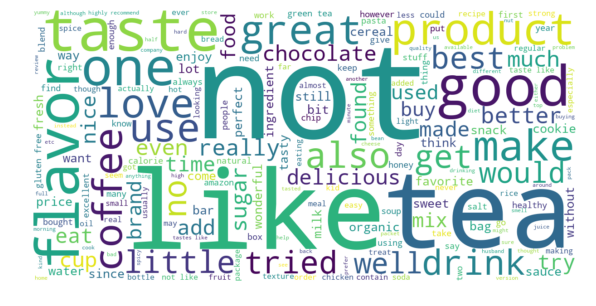

In [31]:
cloud(cluster_1)#generating the wordcloud for cluster 1

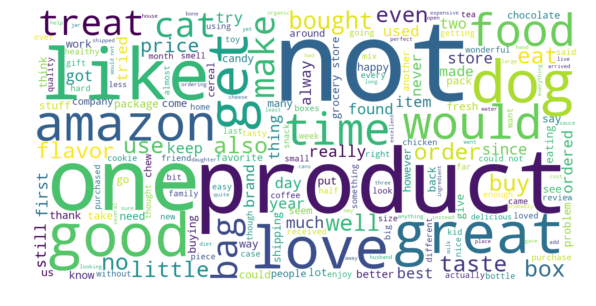

In [32]:
#for cluster 2
cloud(cluster_2)

In [33]:
#for number of cluster 5

n_cluster = 5
agg_model = AgglomerativeClustering(n_clusters = n_cluster,affinity = 'euclidean',linkage = 'ward')
agg_model.fit_predict(avgW2V)

print(agg_model.labels_)


[1 1 3 ... 0 0 2]


In [0]:
#as there are total 5 different clusters thats why we need to create 5 different lists to get the reviews in different clusters'

cluster_1,cluster_2,cluster_3,cluster_4,cluster_5 = [],[],[],[],[]

for i in range(agg_model.labels_.shape[0]):
  if agg_model.labels_[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 1:
    cluster_2.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 2:
    cluster_3.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 3:
    cluster_4.append(preprocessed_reviews[i])
  else:
    cluster_5.append(preprocessed_reviews[i])
  

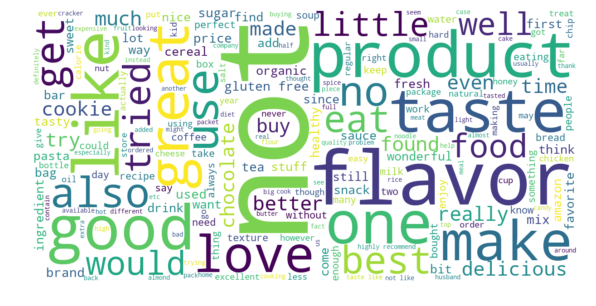

In [35]:
cloud(cluster_1)

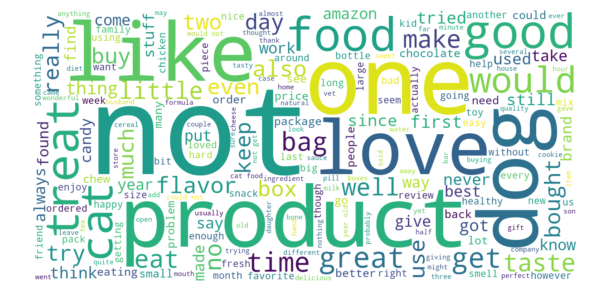

In [36]:
cloud(cluster_2)

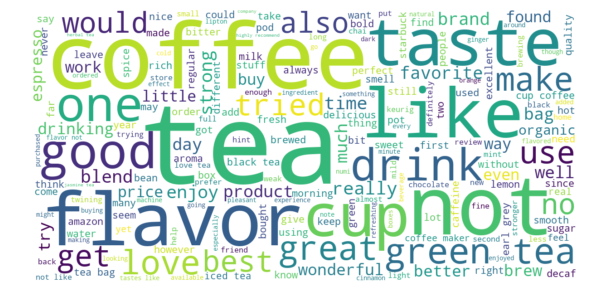

In [37]:
cloud(cluster_3)

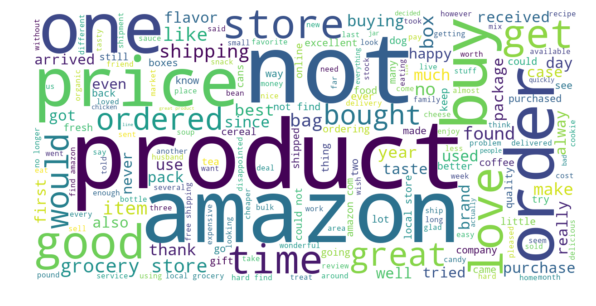

In [38]:
cloud(cluster_4)

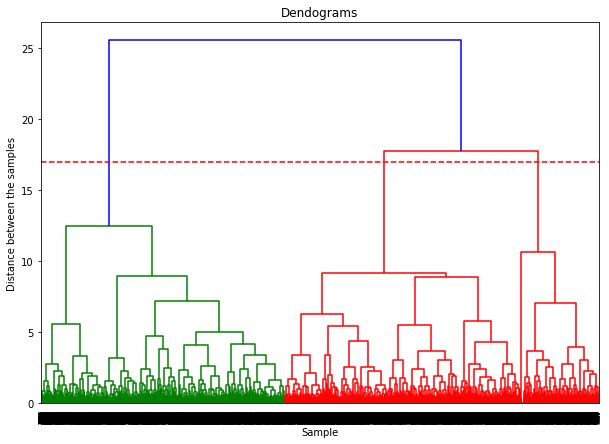

In [39]:
#chossing the number of clusters
from sklearn.preprocessing import normalize
import scipy.cluster.hierarchy as shc


data_normalized = normalize(avgW2V)#normalizing the data

plt.figure(figsize = (10,7))
plt.title('Dendograms')
plt.xlabel('Sample')
plt.ylabel('Distance between the samples')
plt.axhline(y = 17,color = 'r',linestyle = '--' )
dend = shc.dendrogram(shc.linkage(data_normalized,method = 'ward'))



The number of clusters the will be formed at a particular Cluster Cutoff value may be quickly determined from
this plot by drawing a vertical line at that value and counting the number of lines that the vertical line intersects. 

In [40]:
data_normalized.shape

(10000, 50)

In [41]:
#trying with nummber of clusters 3 

agg_model = AgglomerativeClustering(n_clusters = 3,affinity = 'euclidean',linkage = 'ward')
agg_model.fit_predict(avgW2V)

print(agg_model.labels_)


cluster_1,cluster_2,cluster_3 = [],[],[]

for i in range(agg_model.labels_.shape[0]):
  if agg_model.labels_[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 1:
    cluster_2.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 2:
    cluster_3.append(preprocessed_reviews[i])

[0 0 0 ... 1 1 2]


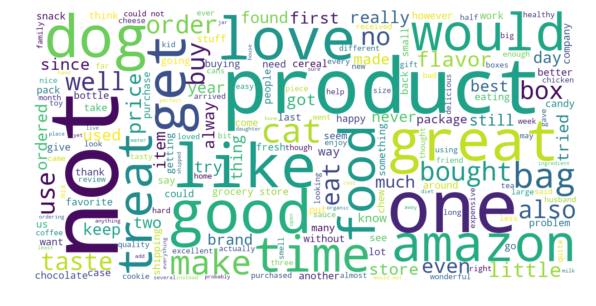

In [42]:
cloud(cluster_1)

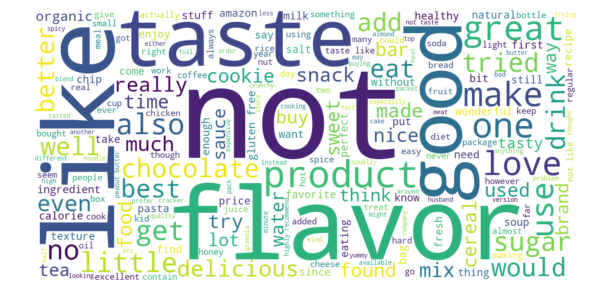

In [43]:
cloud(cluster_2)

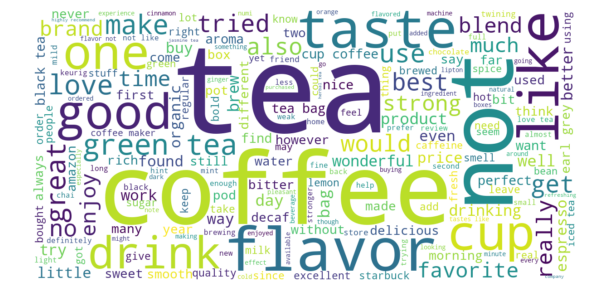

In [44]:
cloud(cluster_3)

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [0]:
# Please write all the code with proper documentation
vect = TfidfVectorizer(min_df = 10)#initializing the tfidf vectorizer 

tf_idf = vect.fit_transform(preprocessed_reviews)#fitting the training data
dictionary = dict(zip(vect.get_feature_names(), list(vect.idf_)))#zipping both of the feature names and vectorizer idf scores

In [46]:

import itertools



dict(itertools.islice(dictionary.items(),20))
#printing first 20 elements of the dictionary

tfidf_feat = vect.get_feature_names()

tfidfw2v = []; # the tfidf-w2v for each sentence/review in training set is stored in this list
row=0;
for sent in (reviews): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidfw2v.append(sent_vec)
    row += 1    
print(len(tfidfw2v))


10000


### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

In [47]:
#taking number of clusters as 2
agg_model = AgglomerativeClustering(n_clusters = 2)
agg_model.fit_predict(tfidfw2v)
labels = agg_model.labels_

print('Number of lables are ',labels.shape[0])

cluster_1 = []
cluster_2 = []

for i in range(labels.shape[0]):
  if labels[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  else:
    cluster_2.append(preprocessed_reviews[i])

print('Number of Data points in cluster 1 are:',len(cluster_1))
print('Number of data points in cluster 2 are: ',len(cluster_2))



Number of lables are  10000
Number of Data points in cluster 1 are: 8525
Number of data points in cluster 2 are:  1475


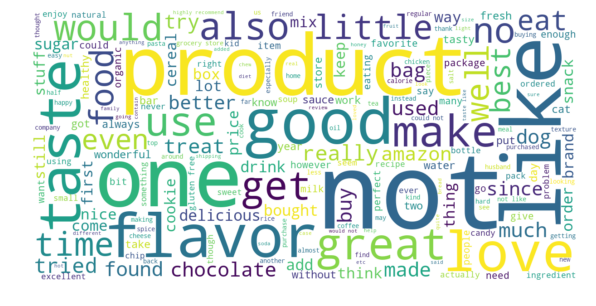

In [48]:
cloud(cluster_1)

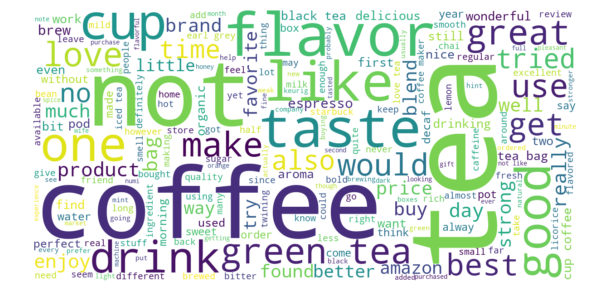

In [49]:
cloud(cluster_2)

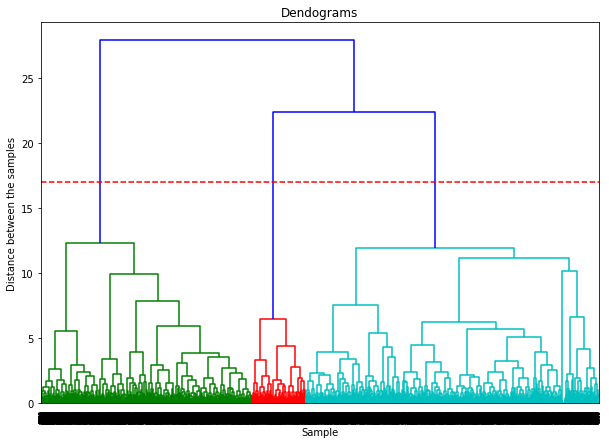

In [50]:
#plotting the dendograms for samples and the distance between them
data_normalized = normalize(tfidfw2v)#normalizing the data

plt.figure(figsize = (10,7))
plt.title('Dendograms')
plt.xlabel('Sample')
plt.ylabel('Distance between the samples')
plt.axhline(y = 17,color = 'r',linestyle = '--' )
dend = shc.dendrogram(shc.linkage(data_normalized,method = 'ward'))


as we can see that the line is cutting the dendograms at three points so,we will consider number of clusters to be 3 here also.


In [51]:
#trying with nummber of clusters 3 

agg_model = AgglomerativeClustering(n_clusters = 3,affinity = 'euclidean',linkage = 'ward')
agg_model.fit_predict(tfidfw2v)

print(agg_model.labels_)


cluster_1,cluster_2,cluster_3 = [],[],[]

for i in range(agg_model.labels_.shape[0]):
  if agg_model.labels_[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 1:
    cluster_2.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 2:
    cluster_3.append(preprocessed_reviews[i])

[0 2 0 ... 0 0 1]


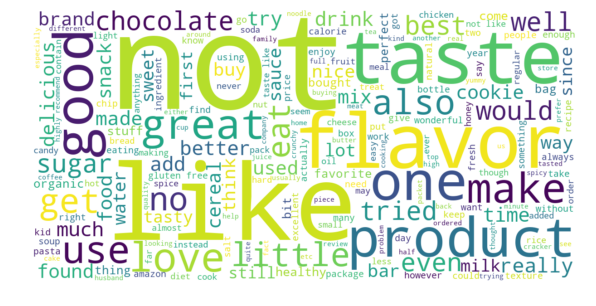

In [52]:
cloud(cluster_1)

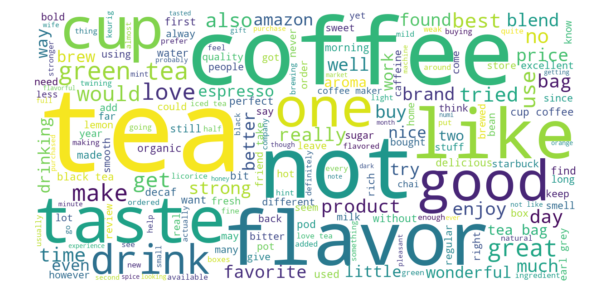

In [53]:
cloud(cluster_2)

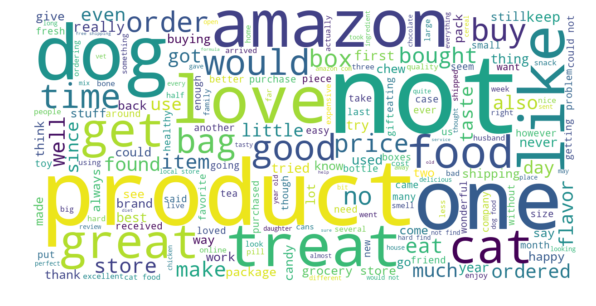

In [54]:
cloud(cluster_3)

In [55]:
#taking number of clusters to be 5

n_cluster = 5
agg_model = AgglomerativeClustering(n_clusters = n_cluster,affinity = 'euclidean',linkage = 'ward')
agg_model.fit_predict(tfidfw2v)

print(agg_model.labels_)
cluster_1,cluster_2,cluster_3,cluster_4,cluster_5 = [],[],[],[],[]

for i in range(agg_model.labels_.shape[0]):
  if agg_model.labels_[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 1:
    cluster_2.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 2:
    cluster_3.append(preprocessed_reviews[i])
  elif agg_model.labels_[i] == 3:
    cluster_4.append(preprocessed_reviews[i])
  else:
    cluster_5.append(preprocessed_reviews[i])
  


[1 4 1 ... 1 1 0]


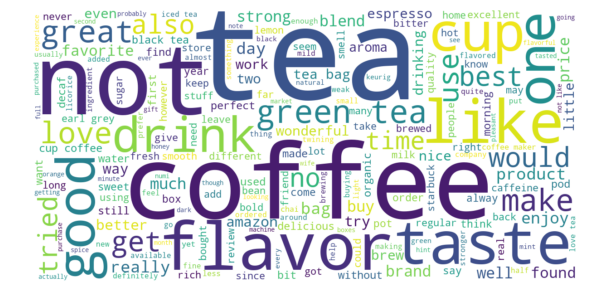

In [56]:
cloud(cluster_1)

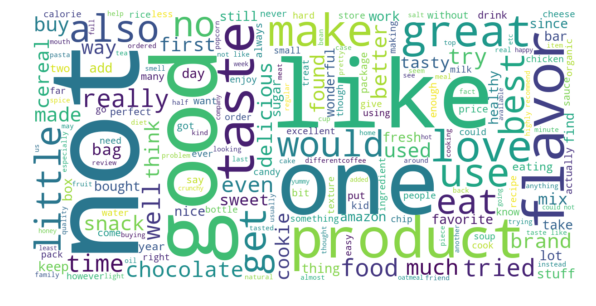

In [57]:
cloud(cluster_2)

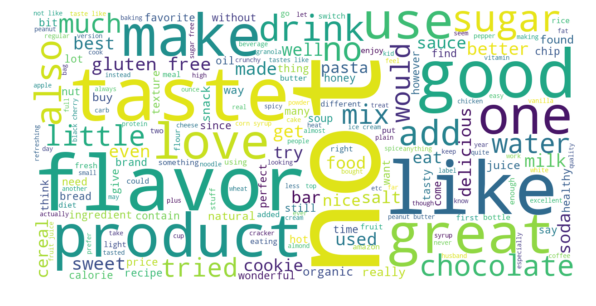

In [58]:
cloud(cluster_3)

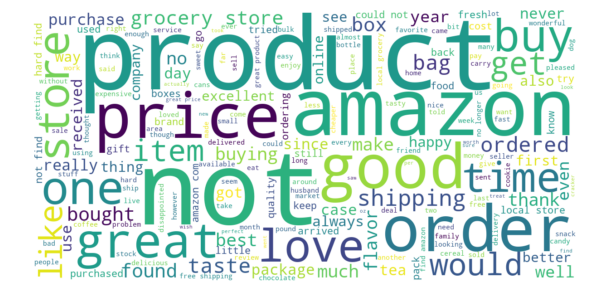

In [59]:
cloud(cluster_4)

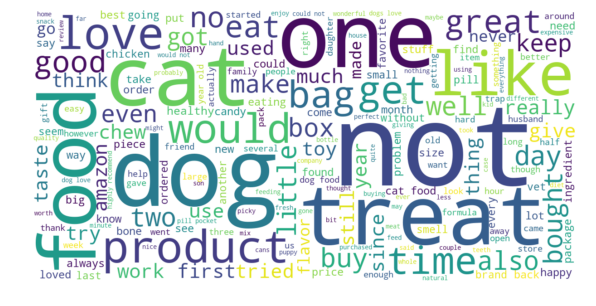

In [60]:
cloud(cluster_5)

We see subgroups that are formed at each fusion  during the cluster analysis.That is why we have visualized the dendograms
to clearly see how the clusters are geeting formed and our choice for optimal number of clusters.

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>






In [0]:
# Please write all the code with proper documentation

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import sklearn.utils


#standardizing the data 
avgw2v = StandardScaler().fit_transform(avgW2V)
tfidfw2v = StandardScaler().fit_transform(tfidfw2v)


In [63]:
avgw2v.shape
#there are 10000 reviews and for each we have a word 2 vec representation of dimesnion 50

(10000, 50)

### Methodology to determine eps:

- We will find the nearest neighbors with min_points and then using elbow method we will determine the eps using the elbow method 
 


In [0]:
from sklearn.neighbors import NearestNeighbors
min_point = 100 #as usually we take number of points to be double

NN = NearestNeighbors(n_neighbors = min_point)
NN.fit(avgw2v)
dist,index = NN.kneighbors(avgw2v)#finding the distance and index of each nearest neighbor



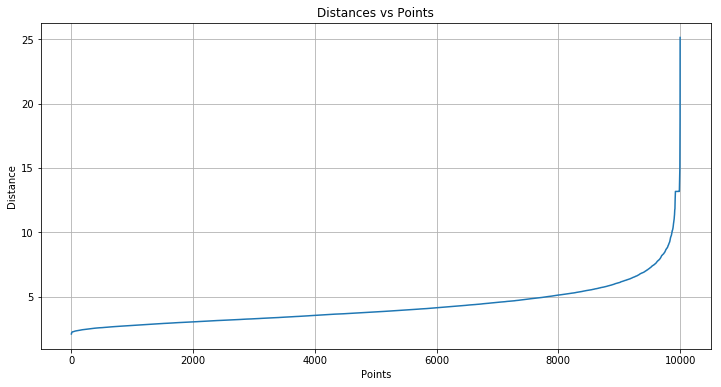

In [65]:
#plotting the results for choosing epsilon
plt.figure(figsize = (12,6))
plt.plot(list(range(1,len(avgw2v)+1)),sorted(dist[:,min_point-1]))
plt.xlabel('Points')
plt.ylabel('Distance')
plt.title('Distances vs Points')
plt.grid()
plt.show()

We sww that there is is some inflection at distance = 9 ,so we will choose eps as 9

In [67]:
#using eps  = 9

db = DBSCAN(eps = 9, min_samples = min_point).fit(avgw2v)
clusters = db.labels_
print('Number of cluasters for eps = 9:',len(set(clusters)))


Number of cluasters for eps = 9: 2


In [0]:
cluster_1 = []
cluster_2 = []


for i in range(0,len(avgw2v)):
  if db.labels_[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  else:
    cluster_2.append(preprocessed_reviews[i])

In [73]:
avgw2v.shape

(10000, 50)

In [0]:
## Visualizing the clusters using Principal Componenet analysis,

#here we will consider 3 clusters with different epsilon values to see how the data distribution and nosie gets affetced 

"""This function visulaizes the data point using scatter plots"""
def db_function(epsilon,data):
  db = DBSCAN(eps = epsilon,min_samples = min_point).fit(data)
  y_pred = db.fit_predict(data)
  plt.figure(figsize = (10,4))
  plt.scatter(data[:,0],data[:,1],c = y_pred,cmap = 'Paired')
  plt.title('DBSCAN with eps:'+ str(epsilon))


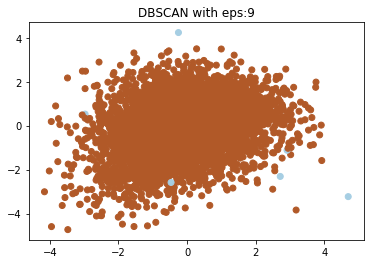

In [77]:
db_function(9,avgw2v)

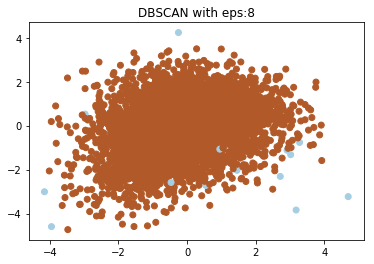

In [78]:
db_function(8,avgw2v)

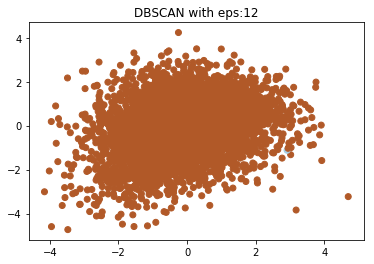

In [80]:
db_function(12,avgw2v)

### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

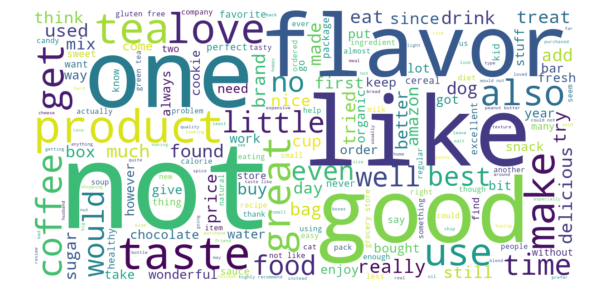

In [0]:
cloud(cluster_1)

as most repeated words in this cluster tells the likes and dislikes as flavors for example tea and coffee

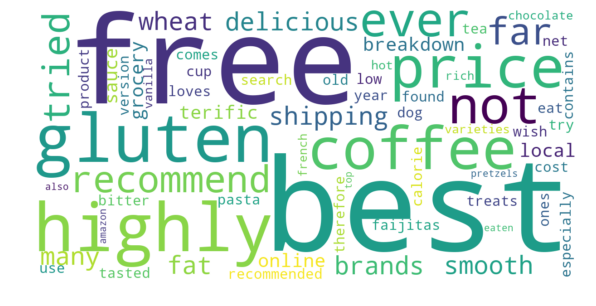

In [0]:
cloud(cluster_2)

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [0]:
# Please write all the code with proper documentation

from sklearn.neighbors import NearestNeighbors
min_point = 100 #as usually we take number of points to be double

NN = NearestNeighbors(n_neighbors = min_point)
NN.fit(tfidfw2v)
dist,index = NN.kneighbors(tfidfw2v)#finding the distance and index of each nearest neighbor



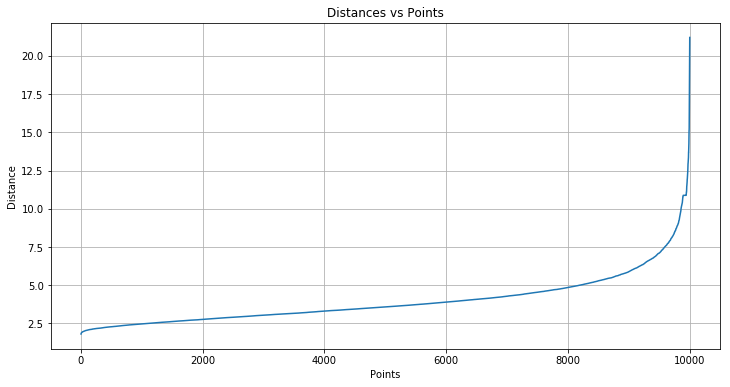

In [0]:
#plotting the results for choosing epsilon
plt.figure(figsize = (12,6))
plt.plot(list(range(1,len(tfidfw2v)+1)),sorted(dist[:,min_point-1]))
plt.xlabel('Points')
plt.ylabel('Distance')
plt.title('Distances vs Points')
plt.grid()
plt.show()

In [0]:
#using eps  = 9

db = DBSCAN(eps = 9, min_samples = min_pts).fit(tfidfw2v)
clusters = db.labels_
print('Number of cluasters for eps = 9:',len(set(clusters)))


Number of cluasters for eps = 9: 2


In [0]:
cluster_1 = []
cluster_2 = []


for i in range(0,len(tfidfw2v)):
  if db.labels_[i] == 0:
    cluster_1.append(preprocessed_reviews[i])
  else:
    cluster_2.append(preprocessed_reviews[i])

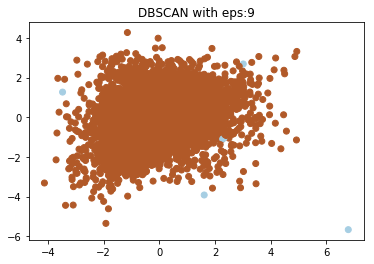

In [81]:
#plotting the clusters
db_function(9,tfidfw2v)

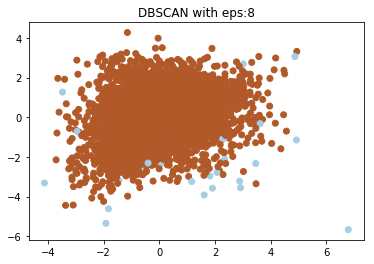

In [82]:
db_function(8,tfidfw2v)

In [0]:
db_function(12,tfidfw2v)

### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

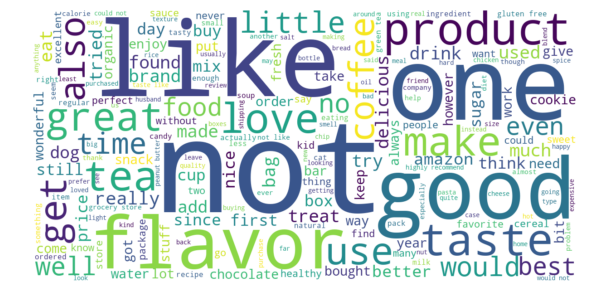

In [0]:
# Please write all the code with proper documentation
cloud(cluster_1)

as common words are highlighted in bold and larger font,we can conclude this cluster mainly tells the kind of flavours and their response by the customers

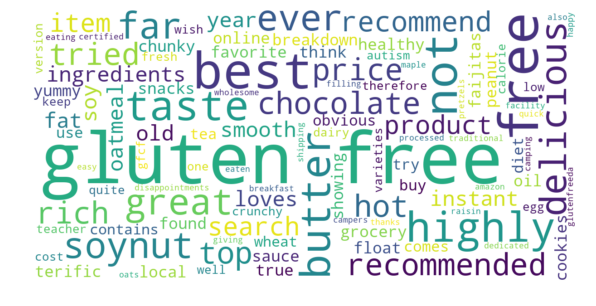

In [0]:
cloud(cluster_2)

# [6] Conclusions

In [178]:
# Please compare all your models using Prettytable library. 
# You can have 3 tables, one each for kmeans, agllomerative and dbscan


from prettytable import PrettyTable

table_kmeans = PrettyTable()
n = [1,2,3,4]

vectorizers = ['Bag of words','TFIDF','Average Word 2 Vec','TFIDF Word 2 Vec']
n_c = ['8','7','7','5']

table_kmeans.add_column('S no:',n)
table_kmeans.add_column('Vectorizer',vectorizers)
table_kmeans.add_column('Optimal Number of Clusters',n_c)

print('\t KMEANS CLUSTERING(with number of data points 50000)')
print(table_kmeans) 

print('\n')
print('=================================================================================')


#table for agglomerative clustering
table_h = PrettyTable()
n = [1,2]

vectorizers = ['Average Word 2 Vec','TFIDF Word 2 Vec']
n_c = ['3','3']

table_h.add_column('S no:',n)
table_h.add_column('Vectorizer',vectorizers)
table_h.add_column('Optimal Number of Clusters',n_c)
print('\n')
print('\t AGGLOMERATIVE CLUSTERING(with number of data points 10000)')
print(table_h) 

print('\n')
print('=================================================================================')


#table for DBSCAN clustering

table_db = PrettyTable()
n = [1,2]
vectorizers = ['Average Word 2 Vec','TFIDF Word 2 Vec']
eps = ['9','9']
n_c = ['2','2']

table_db.add_column('S no:',n)
table_db.add_column('Vectorizer',vectorizers)
table_db.add_column('EPS',eps)
table_db.add_column('Optimal Number of Clusters',n_c)
print('\n')
print('\t DBSCAN CLUSTERING(with number of data points 10000)')
print(table_db) 


	 KMEANS CLUSTERING(with number of data points 50000)
+-------+--------------------+----------------------------+
| S no: |     Vectorizer     | Optimal Number of Clusters |
+-------+--------------------+----------------------------+
|   1   |    Bag of words    |             8              |
|   2   |       TFIDF        |             7              |
|   3   | Average Word 2 Vec |             7              |
|   4   |  TFIDF Word 2 Vec  |             5              |
+-------+--------------------+----------------------------+




	 AGGLOMERATIVE CLUSTERING(with number of data points 10000)
+-------+--------------------+----------------------------+
| S no: |     Vectorizer     | Optimal Number of Clusters |
+-------+--------------------+----------------------------+
|   1   | Average Word 2 Vec |             3              |
|   2   |  TFIDF Word 2 Vec  |             3              |
+-------+--------------------+----------------------------+




	 DBSCAN CLUSTERING(with number of da